In [77]:
import rasterstats as rs
import geoTim
import plotly.express as px
import pyproj
import pandas as pd

pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 1000)

In [7]:
SHAPE_PATH = 'C:\\Users\\comp\\Documents\\New York\\Shapefile\\nycd.shp'
RASTER_PATH = 'C:\\Users\\comp\\Documents\\New York\\Land_20Cover_202010\\landcover_2010_nyc_3ft.img'
stats = rs.zonal_stats(SHAPE_PATH,
                       RASTER_PATH,
                      categorical = True,
                      copy_properties = True,
                      geojson_out = True)

C:\Users\comp\anaconda3\envs\env_raster\lib\site-packages\rasterstats\io.py:301: UserWarning: Setting nodata to -999; specify nodata explicitly
  warnings.warn("Setting nodata to -999; specify nodata explicitly")


In [12]:
type(stats)

list

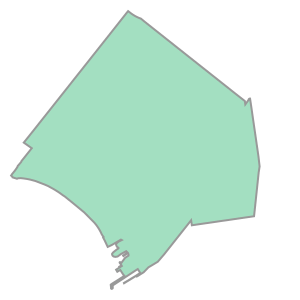

In [11]:
from shapely.geometry import asShape
s = stats[0]['geometry']
asShape(s)

In [116]:
import importlib
importlib.reload(geoTim)

df = geoTim.geojson_to_df(stats)
#df

In [117]:
df['sum_raster'] = df.iloc[:, 3:11].sum(axis=1)
#df.iloc[:,3:11]
df['perc_green'] = (df[1] + df[2]) / df['sum_raster']

In [99]:
#df

,BoroCD,Shape_Leng,Shape_Area,0,1,2,3,4,5,6,7,geometry,sum_raster,perc_green
0,311,51566.989025,1.031759e+08,22381.0,1123585,426824,7751.0,4914.0,3749665,1943891,4185033,"POLYGON ((991748.3936157227 161084.9552001953,...",11464044.0,0.135241
1,404,36821.131612,6.563509e+07,39.0,933666,439898,3877.0,NaN,2283105,1389810,2242380,"POLYGON ((1026508.290222168 208553.8619995117,...",7292775.0,0.188346
2,313,65747.318864,8.814890e+07,261110.0,1236310,1346236,675275.0,26922.0,1692877,1607837,2947756,"POLYGON ((988770.7620239258 156350.5123901367,...",9794323.0,0.263678
3,312,52287.495844,9.985352e+07,8.0,1714899,713147,9985.0,1.0,3753916,1657698,3245167,"POLYGON ((992187.4083862305 175455.4674072266,...",11094821.0,0.218845
4,314,49220.264822,8.217925e+07,26.0,1963919,572025,27695.0,NaN,2921261,1303797,2342297,"POLYGON ((996375.2443847656 177931.1611938477,...",9131020.0,0.277728
5,309,29945.589933,4.532659e+07,23.0,761497,256342,3134.0,NaN,1732488,778497,1504293,"POLYGON ((1004024.53338623 181378.0928344727, ...",5036274.0,0.202102
6,315,115288.886036,1.316470e+08,45250.0,2491251,1137011,84408.0,7289.0,4070958,2372180,4419150,"POLYGON ((1006999.999389648 152990.4486083984,...",14627497.0,0.248044
7,304,37028.024932,5.666878e+07,NaN,891784,668379,7200.0,NaN,2028127,916101,1784961,"POLYGON ((1012965.523193359 187886.9494018555,...",6296552.0,0.247781
8,480,45447.347541,3.272264e+07,5462.0,160630,514579,20912.0,45526.0,227533,2110605,550582,"POLYGON ((1022267.307983398 218659.5328369141,...",3635829.0,0.185710
9,316,33028.535643,5.176662e+07,1.0,820514,523922,11877.0,452.0,1539782,1067526,1787760,"POLYGON ((1010864.381591797 186749.3713989258,...",5751834.0,0.233740


In [118]:
from functools import partial
from shapely.ops import transform

# preserve units is very important here
p1 = pyproj.Proj(init = 'epsg:2263', preserve_units = True)
p2 = pyproj.Proj(init = 'epsg:4326')

project = partial(pyproj.transform, p1, p2)

importlib.reload(geoTim)

df['geometry'] = df['geometry'].apply(lambda x : geoTim.transform_multi(project, x))

In [119]:
df

,BoroCD,Shape_Leng,Shape_Area,0,1,2,3,4,5,6,7,geometry,sum_raster,perc_green
0,311,51566.989025,1.031759e+08,22381.0,1123585,426824,7751.0,4914.0,3749665,1943891,4185033,POLYGON ((-73.97299434004843 40.60881414180238...,11464044.0,0.135241
1,404,36821.131612,6.563509e+07,39.0,933666,439898,3877.0,NaN,2283105,1389810,2242380,POLYGON ((-73.84750820278065 40.73900780703917...,7292775.0,0.188346
2,313,65747.318864,8.814890e+07,261110.0,1236310,1346236,675275.0,26922.0,1692877,1607837,2947756,POLYGON ((-73.98372152615246 40.59582107821704...,9794323.0,0.263678
3,312,52287.495844,9.985352e+07,8.0,1714899,713147,9985.0,1.0,3753916,1657698,3245167,POLYGON ((-73.97139631688175 40.64825778561147...,11094821.0,0.218845
4,314,49220.264822,8.217925e+07,26.0,1963919,572025,27695.0,NaN,2921261,1303797,2342297,POLYGON ((-73.95630035122711 40.65504828183112...,9131020.0,0.277728
5,309,29945.589933,4.532659e+07,23.0,761497,256342,3134.0,NaN,1732488,778497,1504293,POLYGON ((-73.92872204594659 40.66449556918267...,5036274.0,0.202102
6,315,115288.886036,1.316470e+08,45250.0,2491251,1137011,84408.0,7289.0,4070958,2372180,4419150,POLYGON ((-73.91809256480836 40.58657033500472...,14627497.0,0.248044
7,304,37028.024932,5.666878e+07,NaN,891784,668379,7200.0,NaN,2028127,916101,1784961,"POLYGON ((-73.89646625062909 40.6823364224753,...",6296552.0,0.247781
8,480,45447.347541,3.272264e+07,5462.0,160630,514579,20912.0,45526.0,227533,2110605,550582,POLYGON ((-73.86275490196977 40.76676452492578...,3635829.0,0.185710
9,316,33028.535643,5.176662e+07,1.0,820514,523922,11877.0,452.0,1539782,1067526,1787760,POLYGON ((-73.90404639808889 40.67922059801916...,5751834.0,0.233740


In [120]:
'''
FILTERING WAS NECESSARY HERE, BECAUSE PLOTLY DOESN'T LIKE COLUMNS THAT AREN'T STRINGS
'''

df2 = df.filter(['BoroCD','geometry','perc_green'])

In [121]:
gj = geoTim.df_to_geojson(df2)

In [104]:
gj

{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'properties': {'BoroCD': 311},
   'geometry': {'type': 'Polygon',
    'coordinates': (((-65.72562937502173, 41.32280412060611),
      (-65.72517033450288, 41.315711675610764),
      (-65.72495200303398, 41.31233646296834),
      (-65.72482198521399, 41.30752587712115),
      (-65.72574289693834, 41.304801966670794),
      (-65.7263755522612, 41.30243819026531),
      (-65.72708399910108, 41.29977793422539),
      (-65.72923866968787, 41.291764564217544),
      (-65.72958924658481, 41.29045228583269),
      (-65.72992716502438, 41.2891874406662),
      (-65.7305606338699, 41.28683293811721),
      (-65.7312784002493, 41.2842095069095),
      (-65.73410325010391, 41.28409466041094),
      (-65.73692208447126, 41.284000653567496),
      (-65.73729871502474, 41.28398293109037),
      (-65.73913472145139, 41.28391314541401),
      (-65.74221690040811, 41.28379266776755),
      (-65.74555338512849, 41.28366860543153),
      (

In [122]:
'''
PRESERVE UNITS IS IMPORTANT IN PYPROJ TO PROJECT IN THE CORRECT AREA
'''

token = open("C:\\Users\\comp\\Documents\\New York\\token").read()



fig = px.choropleth_mapbox(df2, 
                    geojson=gj,
                    locations='BoroCD',
                    featureidkey= 'properties.BoroCD',
                    color = 'perc_green',
                    zoom=8, center = {"lat": 40, "lon": -73})

# doesn't work with mapbox
#fig.update_geos(fitbounds="locations")
fig.update_layout(mapbox_style="light", mapbox_accesstoken = token)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

fig.show()

In [124]:
df2[['BoroCD', 'perc_green']].to_csv('percent_green.csv', index = False)